In [1]:
import glob
import pandas as pd
import numpy as np
import h5py
import mpld3
import mygene
from geneinfo import geneinfo, geneplot, connect_mygene
mg = mygene.MyGeneInfo()
connect_mygene(mg)

In [2]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
#set_matplotlib_formats('pdf', 'svg')
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gridspec
#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set()
sns.set_style("whitegrid")
sns.set_context("paper")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess

def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pd.concat([df1, df2]).sort_values([start, end])

In [3]:
filenames = glob.glob('../steps/clues/csv/*.csv')

dfs = []
for file in filenames:
    dfs.append(pd.read_csv(file, names=['Chrom', 'SNP', 'Pop', 'LogLikelihoodRatio', 'Selection_coef'], sep='\t', header=None))
df = pd.concat(dfs, ignore_index=True)

In [4]:
for key, val in df.items():
    print(key, val.shape)

Chrom (4503,)
SNP (4503,)
Pop (4503,)
LogLikelihoodRatio (4503,)
Selection_coef (4503,)


In [5]:
df

,Chrom,SNP,Pop,LogLikelihoodRatio,Selection_coef
0,3,46200823,CEU,172.695450,0.007532
1,3,46413743,CEU,35.075170,0.002002
2,3,46555745,CEU,37.770025,0.002497
3,3,46679675,CEU,160.909004,0.003884
4,3,46898562,CEU,210.907055,0.007532
...,...,...,...,...,...
4498,3,52063886,CEU,0.000000,0.000010
4499,3,51324925,CEU,52.260274,0.003114
4500,3,51465696,CEU,23.025617,0.003884
4501,3,51668409,CEU,224.153764,0.006040


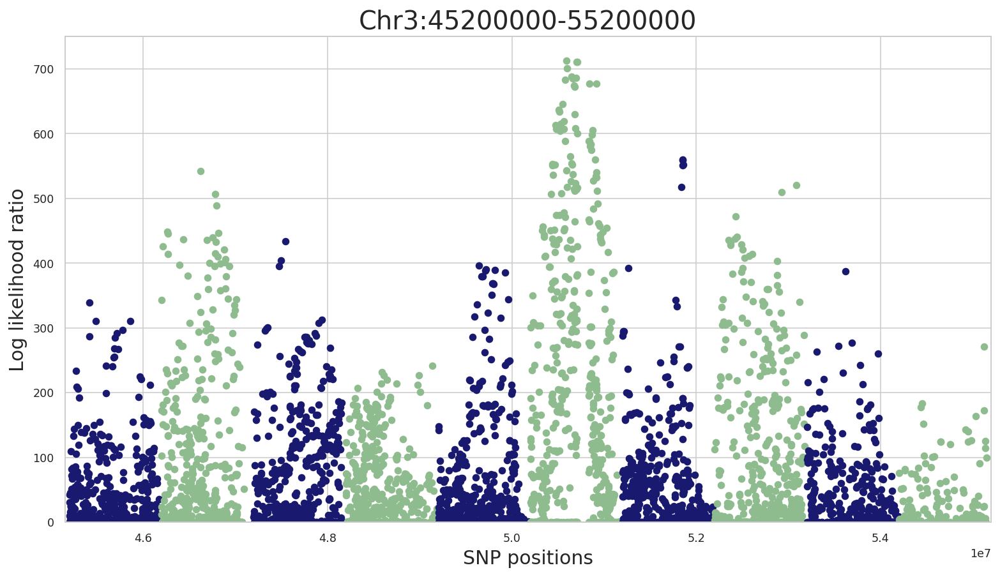

In [6]:
windows = {(45200000,46200000):'midnightblue', (46200000,47200000):"darkseagreen", (47200000,48200000):"midnightblue", 
           (48200000,49200000):"darkseagreen", (49200000,50200000):"midnightblue", (50200000,51200000):"darkseagreen", 
           (51200000,52200000):"midnightblue", (52200000,53200000):"darkseagreen", (53200000,54200000):"midnightblue", 
           (54200000,55300000):"darkseagreen"}

fig, ax = plt.subplots(figsize=(13,7))
for lrange in windows:
    temp = df[(df.SNP>=lrange[0]) & (df.SNP<=lrange[1])]
    ax.plot(temp.SNP,temp.LogLikelihoodRatio,color=windows[lrange], marker="o",ls="none")
    ax.set_xlim([45150000, 55200000])
    ax.set_ylim([0,750])
    ax.set_xlabel('SNP positions', fontsize = 15.0)
    ax.set_ylabel('Log likelihood ratio', fontsize = 15.0)
    ax.set_title('Chr3:45200000-55200000', fontsize = 20.0)

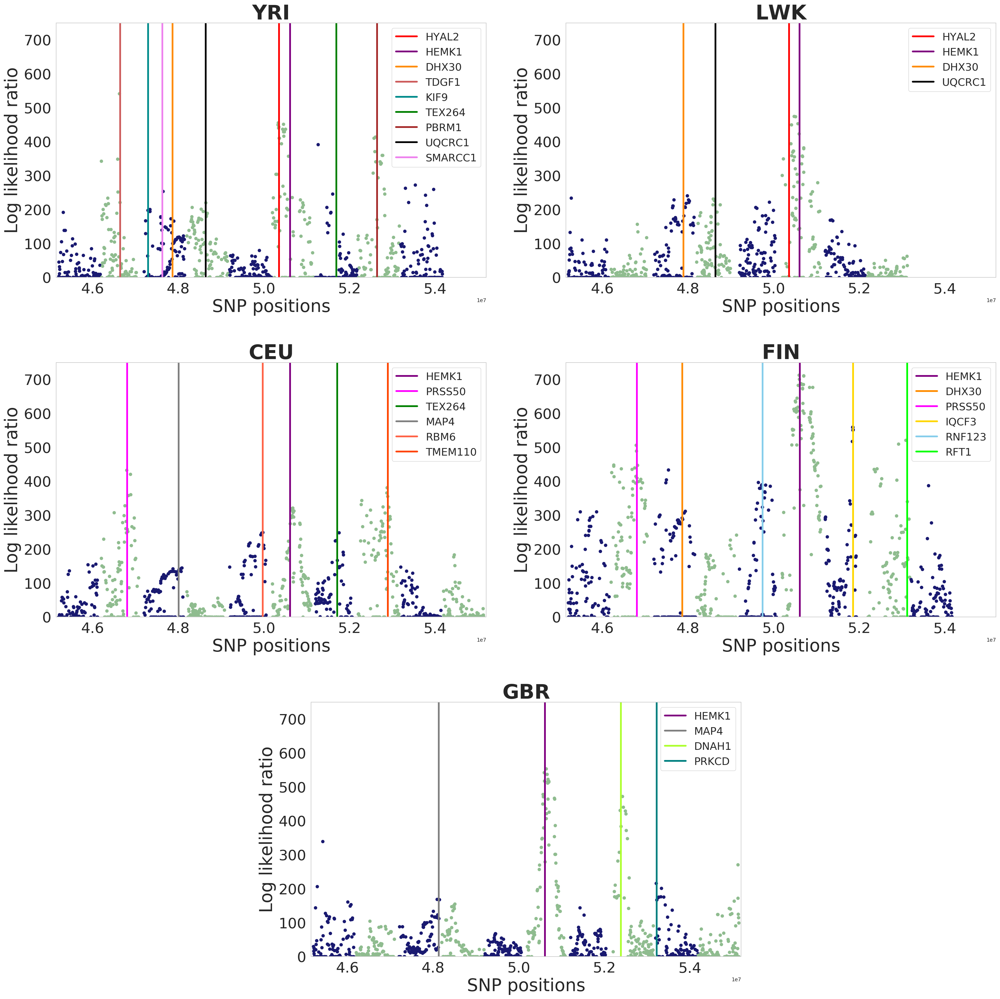

In [58]:
import warnings
warnings.filterwarnings("ignore")

YRI_df = df[df.Pop == 'YRI']
LWK_df = df[df.Pop == 'LWK']
CEU_df = df[df.Pop == 'CEU']
FIN_df = df[df.Pop == 'FIN']
GBR_df = df[df.Pop == 'GBR']

fig, axs = plt.subplots(figsize=(25, 25))
gs = gridspec.GridSpec(3,4)

for lrange in windows:
    temp_YRI = YRI_df[(YRI_df.SNP>=lrange[0]) & (YRI_df.SNP<=lrange[1])]
    ax1 = plt.subplot(gs[0,0:2])
    ax1.plot(temp_YRI.SNP, temp_YRI.LogLikelihoodRatio, color=windows[lrange], marker="o",ls="none") 
    ax1.set_title('YRI', fontsize = 35.0, weight='bold')
    ax1.set(xlim=[45150000, 55200000], ylim=[0, 750])
    ax1.set_xlabel('SNP positions', fontsize = 30.0)
    ax1.set_ylabel('Log likelihood ratio', fontsize = 30.0)
    plt.setp(ax1.get_xticklabels(), fontsize=25)
    plt.setp(ax1.get_yticklabels(), fontsize=25)
    ax1.grid(False)
    
    temp_LWK = LWK_df[(LWK_df.SNP>=lrange[0]) & (LWK_df.SNP<=lrange[1])]
    ax2 = plt.subplot(gs[0,2:4])
    ax2.plot(temp_LWK.SNP, temp_LWK.LogLikelihoodRatio, color=windows[lrange], marker="o",ls="none")
    ax2.set_title('LWK', fontsize = 35.0, weight='bold')
    ax2.set(xlim=[45150000, 55200000], ylim=[0, 750])
    ax2.set_xlabel('SNP positions', fontsize = 30.0)
    ax2.set_ylabel('Log likelihood ratio', fontsize = 30.0)
    plt.setp(ax2.get_xticklabels(), fontsize=25)
    plt.setp(ax2.get_yticklabels(), fontsize=25)
    ax2.grid(False)
    
    temp_CEU = CEU_df[(CEU_df.SNP>=lrange[0]) & (CEU_df.SNP<=lrange[1])]
    ax3 = plt.subplot(gs[1,0:2])
    ax3.plot(temp_CEU.SNP, temp_CEU.LogLikelihoodRatio, color=windows[lrange], marker="o",ls="none") 
    ax3.set_title('CEU', fontsize = 35.0, weight='bold')
    ax3.set(xlim=[45150000, 55200000], ylim=[0, 750])
    ax3.set_xlabel('SNP positions', fontsize = 30.0)
    ax3.set_ylabel('Log likelihood ratio', fontsize = 30.0)
    plt.setp(ax3.get_xticklabels(), fontsize=25)
    plt.setp(ax3.get_yticklabels(), fontsize=25)
    ax3.grid(False)
    
    temp_FIN = FIN_df[(FIN_df.SNP>=lrange[0]) & (FIN_df.SNP<=lrange[1])]
    ax4 = plt.subplot(gs[1,2:4])
    ax4.plot(temp_FIN.SNP, temp_FIN.LogLikelihoodRatio, color=windows[lrange], marker="o",ls="none") 
    ax4.set_title('FIN', fontsize = 35.0, weight='bold')
    ax4.set(xlim=[45150000, 55200000], ylim=[0, 750])
    ax4.set_xlabel('SNP positions', fontsize = 30.0)
    ax4.set_ylabel('Log likelihood ratio', fontsize = 30.0)
    plt.setp(ax4.get_xticklabels(), fontsize=25)
    plt.setp(ax4.get_yticklabels(), fontsize=25)
    ax4.grid(False)
 
    temp_GBR = GBR_df[(GBR_df.SNP>=lrange[0]) & (GBR_df.SNP<=lrange[1])]
    ax5 = plt.subplot(gs[2,1:3])
    ax5.plot(temp_GBR.SNP, temp_GBR.LogLikelihoodRatio, color=windows[lrange], marker="o",ls="none") 
    ax5.set_title('GBR', fontsize = 35.0, weight='bold')
    ax5.set(xlim=[45150000, 55200000], ylim=[0, 750])
    ax5.set_xlabel('SNP positions', fontsize = 30.0)
    ax5.set_ylabel('Log likelihood ratio', fontsize = 30.0)
    plt.setp(ax5.get_xticklabels(), fontsize=25)
    plt.setp(ax5.get_yticklabels(), fontsize=25)
    ax5.grid(False)

ax1.axvline(x=50357780, label='HYAL2', color='red', linewidth=3)
ax1.axvline(x=50614475, label='HEMK1', color='purple', linewidth=3)
ax1.axvline(x=47868042, label='DHX30', color='darkorange', linewidth=3)
ax1.axvline(x=46642039, label='TDGF1', color='indianred', linewidth=3)
ax1.axvline(x=47297229, label='KIF9', color='darkcyan', linewidth=3)
ax1.axvline(x=51696709, label='TEX264', color='green', linewidth=3)
ax1.axvline(x=52649651, label='PBRM1', color='brown', linewidth=3)
ax1.axvline(x=48642422, label='UQCRC1', color='black', linewidth=3)
ax1.axvline(x=47626762, label='SMARCC1', color='violet', linewidth=3)

ax2.axvline(x=50360338, label='HYAL2', color='red', linewidth=3)
ax2.axvline(x=50606583, label='HEMK1', color='purple', linewidth=3)
ax2.axvline(x=47891685, label='DHX30', color='darkorange', linewidth=3)
ax2.axvline(x=48642422, label='UQCRC1', color='black', linewidth=3)

ax3.axvline(x=50614475, label='HEMK1', color='purple', linewidth=3)
ax3.axvline(x=46803835, label='PRSS50', color='magenta', linewidth=3)
ax3.axvline(x=51858248, label='IQCF3', color='gold', linewidth=3)
ax3.axvline(x=51717524, label='TEX264', color='green', linewidth=3)
ax3.axvline(x=48011476, label='MAP4', color='grey', linewidth=3)
ax3.axvline(x=49977440, label='RBM6', color='tomato', linewidth=3)
ax3.axvline(x=52899358, label='TMEM110', color='orangered', linewidth=3)

ax4.axvline(x=50614475, label='HEMK1', color='purple', linewidth=3)
ax4.axvline(x=47868042, label='DHX30', color='darkorange', linewidth=3)
ax4.axvline(x=46803835, label='PRSS50', color='magenta', linewidth=3)
ax4.axvline(x=51858248, label='IQCF3', color='gold', linewidth=3)
ax4.axvline(x=49742947, label='RNF123', color='skyblue', linewidth=3)
ax4.axvline(x=53122499, label='RFT1', color='lime', linewidth=3)

ax5.axvline(x=50614475, label='HEMK1', color='purple', linewidth=3)
ax5.axvline(x=48130769, label='MAP4', color='grey', linewidth=3)
ax5.axvline(x=52392421, label='DNAH1', color='greenyellow', linewidth=3)
ax5.axvline(x=53226733, label='PRKCD', color='teal', linewidth=3)

ax1.legend(fontsize=18)
ax2.legend(fontsize=18)
ax3.legend(fontsize=18)
ax4.legend(fontsize=18)
ax5.legend(fontsize=18)

fig.tight_layout(pad=5.0)
plt.savefig('../plots/manhattan_with_bars.pdf') 

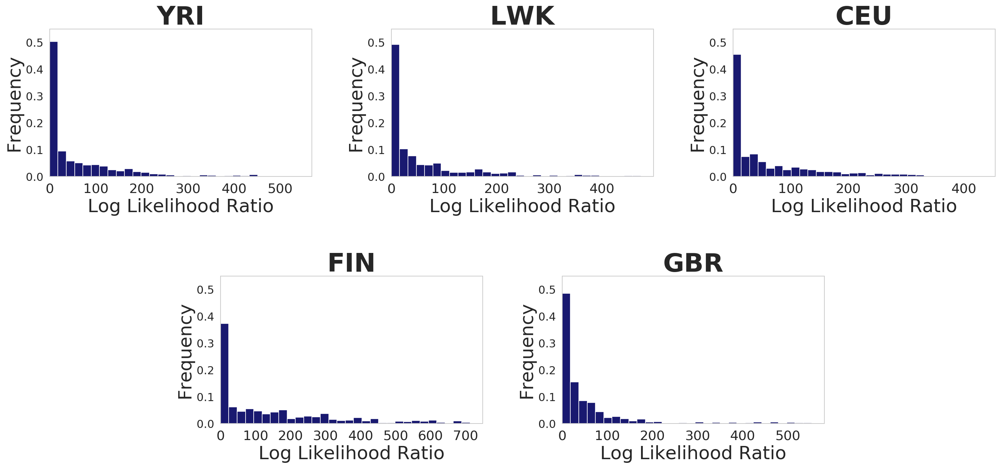

In [88]:
# bins=[0,50,100,150,200,250,300,350,400,450,500,550,600,650,700,750]
bins=30

# fig, axes = plt.subplots(2, 3, figsize=(20, 10))

fig, axes = plt.subplots(figsize=(20, 10))
gs = gridspec.GridSpec(2,6)

ax1 = plt.subplot(gs[0,0:2])
ax1.hist(x=YRI_df['LogLikelihoodRatio'], weights=(np.ones(len(YRI_df['LogLikelihoodRatio']))/len(YRI_df['LogLikelihoodRatio'])),
         color='midnightblue', bins=bins)
ax1.set_title('YRI', fontsize = 35.0, weight='bold')
ax1.set(xlim=0, ylim=[0, 0.55])
ax1.set_xlabel('Log Likelihood Ratio', fontsize = 25.0)
ax1.set_ylabel('Frequency', fontsize = 25.0)
plt.setp(ax1.get_xticklabels(), fontsize=18)
plt.setp(ax1.get_yticklabels(), fontsize=15) 
ax1.grid(False)

ax2 = plt.subplot(gs[0,2:4])
ax2.hist(x=LWK_df['LogLikelihoodRatio'], weights=(np.ones(len(LWK_df['LogLikelihoodRatio']))/len(LWK_df['LogLikelihoodRatio'])),
         color='midnightblue', bins=bins)
ax2.set_title('LWK', fontsize = 35.0, weight='bold')
ax2.set(xlim=0, ylim=[0, 0.55])
ax2.set_xlabel('Log Likelihood Ratio', fontsize = 25.0)
ax2.set_ylabel('Frequency', fontsize = 25.0)
plt.setp(ax2.get_xticklabels(), fontsize=18)
plt.setp(ax2.get_yticklabels(), fontsize=15) 
ax2.grid(False)

ax3 = plt.subplot(gs[0,4:6])
ax3.hist(x=CEU_df['LogLikelihoodRatio'], weights=(np.ones(len(CEU_df['LogLikelihoodRatio']))/len(CEU_df['LogLikelihoodRatio'])), 
         color='midnightblue', bins=bins)
ax3.set_title('CEU', fontsize = 35.0, weight='bold')
ax3.set(xlim=0, ylim=[0, 0.55])
ax3.set_xlabel('Log Likelihood Ratio', fontsize = 25.0)
ax3.set_ylabel('Frequency', fontsize = 25.0)
plt.setp(ax3.get_xticklabels(), fontsize=18)
plt.setp(ax3.get_yticklabels(), fontsize=15) 
ax3.grid(False)

ax4 = plt.subplot(gs[1,1:3])
ax4.hist(x=FIN_df['LogLikelihoodRatio'], weights=(np.ones(len(FIN_df['LogLikelihoodRatio']))/len(FIN_df['LogLikelihoodRatio'])),
         color='midnightblue', bins=bins)
ax4.set_title('FIN', fontsize = 35.0, weight='bold')
ax4.set(xlim=0, ylim=[0, 0.55])
ax4.set_xlabel('Log Likelihood Ratio', fontsize = 25.0)
ax4.set_ylabel('Frequency', fontsize = 25.0)
plt.setp(ax4.get_xticklabels(), fontsize=18)
plt.setp(ax4.get_yticklabels(), fontsize=15) 
ax4.grid(False)

ax5 = plt.subplot(gs[1,3:5])
ax5.hist(x=GBR_df['LogLikelihoodRatio'], weights=(np.ones(len(GBR_df['LogLikelihoodRatio']))/len(GBR_df['LogLikelihoodRatio'])),
         color='midnightblue', bins=bins)
ax5.set_title('GBR', fontsize = 35.0, weight='bold')
ax5.set(xlim=0, ylim=[0, 0.55])
ax5.set_xlabel('Log Likelihood Ratio', fontsize = 25.0)
ax5.set_ylabel('Frequency', fontsize = 25.0)
plt.setp(ax5.get_xticklabels(), fontsize=18)
plt.setp(ax5.get_yticklabels(), fontsize=15) 
ax5.grid(False)
    
fig.tight_layout(pad=5.0)
plt.savefig('../plots/all_hist.pdf')

In [35]:
YRI_df.loc[YRI_df.LogLikelihoodRatio > 5], len(YRI_df)

(      Chrom       SNP  Pop  LogLikelihoodRatio  Selection_coef
 298       3  45758595  YRI            5.747173        0.000532
 299       3  46052263  YRI            7.853137        0.000664
 300       3  45206484  YRI           45.723087        0.001032
 301       3  45348574  YRI           14.223665        0.000828
 302       3  45586554  YRI           98.893631        0.003884
 ...     ...       ...  ...                 ...             ...
 4305      3  52864693  YRI           18.632340        0.000664
 4306      3  53003179  YRI           99.163028        0.002002
 4307      3  52431671  YRI          102.040883        0.002497
 4308      3  52727257  YRI          333.745679        0.009393
 4310      3  53015839  YRI           93.138994        0.003114
 
 [544 rows x 5 columns],
 883)

In [30]:
chrom, start, end = 'chr3', 45200000, 55200000
ax = geneplot(chrom, start, end, figsize=(11, 5))
ax.plot(YRI_df['SNP'], YRI_df['LogLikelihoodRatio'], 'o') ;
mpld3.display()

Fetching 344 gene(s) . . .


In [38]:
chrom, start, end = 'chr3', 45200000, 55200000
ax = geneplot(chrom, start, end, figsize=(10, 5))
ax.plot(LWK_df['SNP'], LWK_df['LogLikelihoodRatio'], 'o') ;
mpld3.display()

Fetching 344 gene(s) . . .


In [26]:
chrom, start, end = 'chr3', 45200000, 55200000
ax = geneplot(chrom, start, end, figsize=(11, 5))
ax.plot(CEU_df['SNP'], CEU_df['LogLikelihoodRatio'], 'o') ;
mpld3.display()

Fetching 344 gene(s) . . .


In [31]:
chrom, start, end = 'chr3', 45200000, 55200000
ax = geneplot(chrom, start, end, figsize=(11, 5))
ax.plot(FIN_df['SNP'], FIN_df['LogLikelihoodRatio'], 'o') ;
mpld3.display()

Fetching 344 gene(s) . . .


In [41]:
chrom, start, end = 'chr3', 45200000, 55200000
ax = geneplot(chrom, start, end, figsize=(12, 5))
ax.plot(GBR_df['SNP'], GBR_df['LogLikelihoodRatio'], 'o') ;
mpld3.display()

Fetching 344 gene(s) . . .


Making file for LocusZoom

In [12]:
#Order file according to position
sorted_YRI = YRI_df.sort_values('SNP')
sorted_LWK = LWK_df.sort_values('SNP')
sorted_CEU = CEU_df.sort_values('SNP')
sorted_FIN = FIN_df.sort_values('SNP')
sorted_GBR = GBR_df.sort_values('SNP')

sorted_YRI.to_csv('../steps/text/YRI_snps.txt', sep='\t', columns=['Chrom', 'SNP', 'LogLikelihoodRatio'], index=False)
sorted_LWK.to_csv('../steps/text/LWK_snps.txt', sep='\t', columns=['Chrom', 'SNP', 'LogLikelihoodRatio'], index=False)
sorted_CEU.to_csv('../steps/text/CEU_snps.txt', sep='\t', columns=['Chrom', 'SNP', 'LogLikelihoodRatio'], index=False)
sorted_FIN.to_csv('../steps/text/FIN_snps.txt', sep='\t', columns=['Chrom', 'SNP', 'LogLikelihoodRatio'], index=False)
sorted_GBR.to_csv('../steps/text/GBR_snps.txt', sep='\t', columns=['Chrom', 'SNP', 'LogLikelihoodRatio'], index=False)

Loading h5 containing SNP with highest log likelihood ratio

In [95]:
h5 = h5py.File('../steps/clues/clues_3_50000000_51400000_FIN/clues_3_50706496_FIN.h5', 'r')

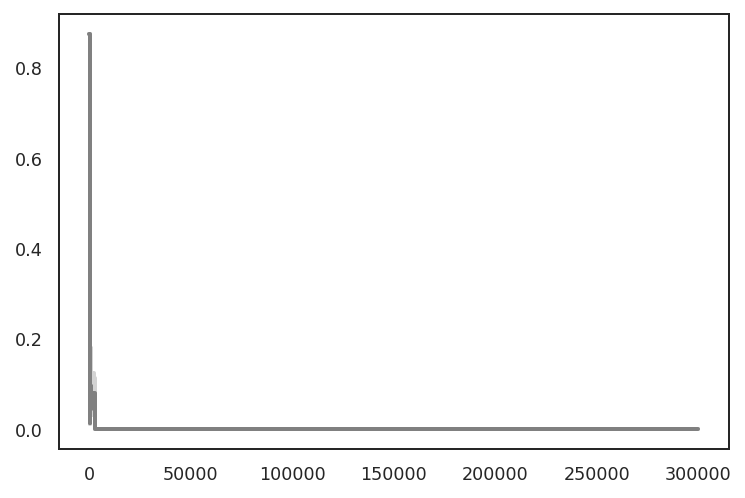

In [98]:
df = pd.DataFrame(dict(start=h5.attrs['t'][:-1], 
                       end=h5.attrs['t'][1:], 
                       freq=h5.attrs['xHat'],
                       upper=h5.attrs['xHatHi'],
                       lower=h5.attrs['xHatLo']
                           ))

plot_df = stairs(df)
with sns.axes_style('white'):
    plt.plot(plot_df.pos, plot_df.upper, color='lightgrey', linewidth=2)
    plt.plot(plot_df.pos, plot_df.lower, color='lightgrey', linewidth=2)
    plt.plot(plot_df.pos, plot_df.freq, color='grey', linewidth=2)

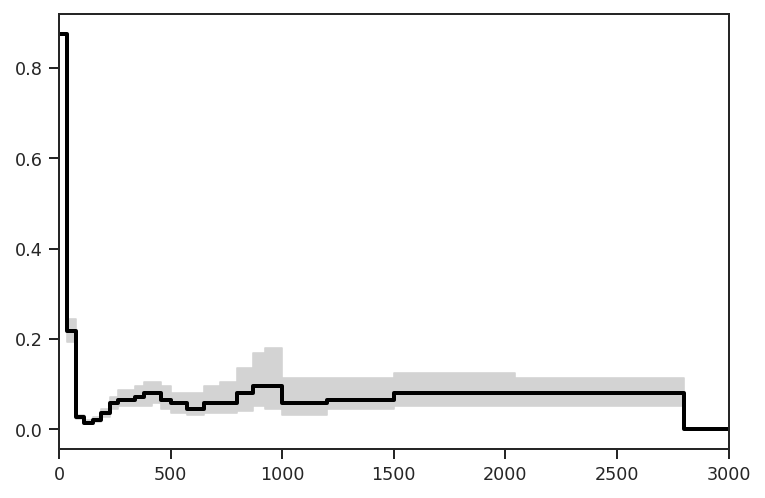

In [110]:
plot_df = stairs(df)
with sns.axes_style('ticks'):
    plt.fill_between(plot_df.pos, plot_df.upper, plot_df.lower, color='lightgrey')
    plt.plot(plot_df.pos, plot_df.freq, color='black', linewidth=2)
    plt.xlim(0, 3000)